In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

In [2]:
df = pd.read_csv("/content/drive/MyDrive/WMCA/chaid_data.csv")

In [3]:
df['postcode_first'] = df['postcode'].str.split(' ', 1, expand=True)[0]

In [14]:
df.groupby(['postcode_first', 'current-energy-rating']).std()['total-floor-area'].describe()

count    649.000000
mean      31.053636
std       12.136356
min        1.414214
25%       23.573574
50%       29.241703
75%       37.727823
max       69.739280
Name: total-floor-area, dtype: float64

## Variation in energy efficiency

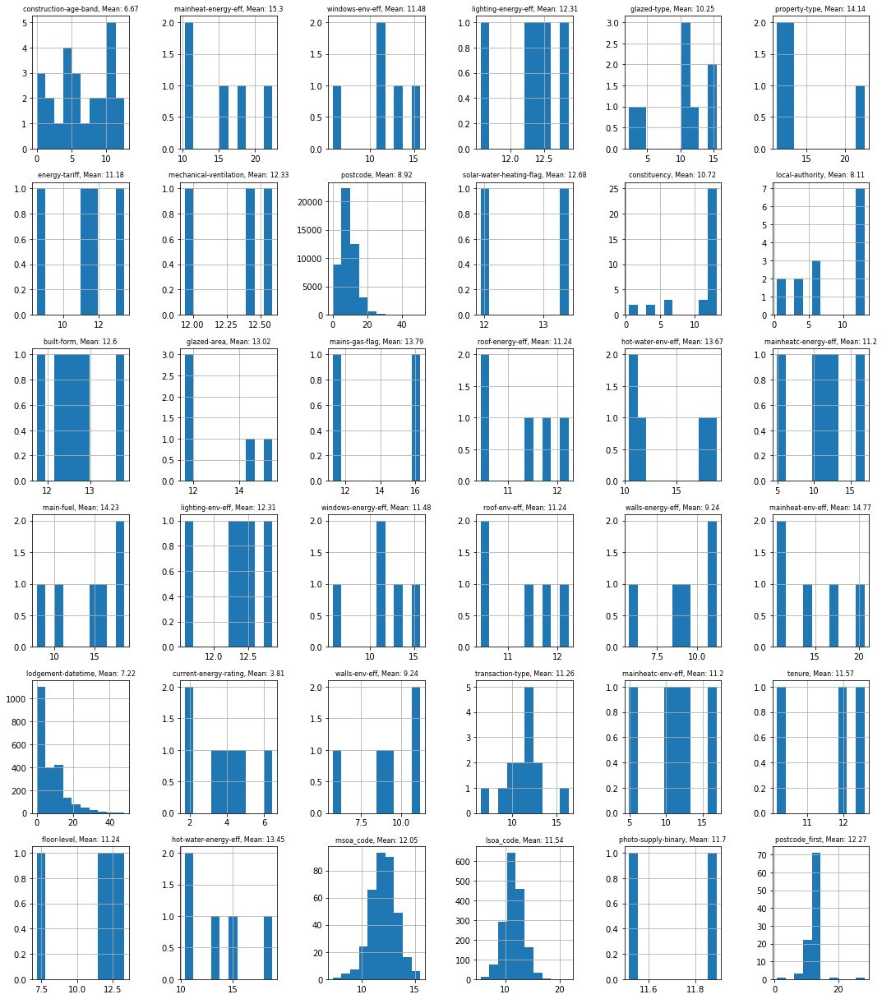

In [14]:
fig, axs= plt.subplots(6,6,figsize=(15,17))
axs_list = axs.ravel()

col_list = list(df.select_dtypes(include=['object']).columns)
col_list = [col for col in col_list if '-description' not in col]
col_list.remove('inspection-date')
col_list.remove('address')

for i, col in enumerate(col_list):
  grouped_df = df.groupby(col).std()['current-energy-efficiency']
  grouped_df.hist(ax=axs_list[i])
  mean = grouped_df.mean()
  axs_list[i].set_title(col + f", Mean: {str(round(mean,2,))}", fontsize=8)

plt.tight_layout()
plt.show()

# Super naive model

## Current energy efficiency (continuous variable)

In [18]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import math

In [104]:
X_train, X_test, y_train, y_test = train_test_split(
    df[['postcode', 'local-authority']], df['current-energy-efficiency'], 
    test_size=0.3, random_state=123)
X_train['y'] = y_train

In [102]:
# Distribution of postcodes will tell us if we should aggregate by median or mean
from scipy.stats import skew

postcode_skew = []

for postcode, agg in df.groupby('postcode'):
  postcode_skew.append(skew(agg['current-energy-efficiency']))

plt.hist(postcode_skew)
plt.show()

In [108]:
def naive_model(train, X_test, y_test, group_var):
  """
  Computes the naive model performance for predicting energy efficiency.

  Input:
  train(DataFrame): X_train and y_train
  X_test(DataFrame): X_test
  y_test(Series): y_test
  group_var(str): Variable to group on
  """
  grouped_train = train.groupby(group_var).mean()
  mapping = dict(zip(grouped_train.index, grouped_train['y']))
  y_pred = X_test[group_var].map(mapping)
  y_pred[np.isfinite(y_pred) == False] = grouped_train.y.mean()

  print(f"Testing r2: {r2_score(y_test, y_pred)}")
  print(f"Testing MSE: {mean_squared_error(y_test, y_pred)}")
  print(f"Testing Mean Error: {math.sqrt(mean_squared_error(y_test, y_pred))}")

In [109]:
naive_model(X_train, X_test, y_test, 'postcode')

Testing r2: 0.34326392286275986
Testing MSE: 107.40484331697998
Testing Mean Error: 10.363630797986774


In [110]:
naive_model(X_train, X_test, y_test, 'local-authority')

Testing r2: 0.008947637983985901
Testing MSE: 162.08006133186592
Testing Mean Error: 12.73106677901997


## Energy rating (classifcation)

In [114]:
from sklearn.metrics import classification_report

In [111]:
X_train, X_test, y_train, y_test = train_test_split(
    df[['postcode', 'local-authority']], df['current-energy-rating'], 
    test_size=0.3, random_state=123)
X_train['y'] = y_train

In [148]:
def naive_classifier(train, X_test, y_test, group_var):
  """
  Computes the naive model performance for predicting energy rating.

  Input:
  train(DataFrame): X_train and y_train
  X_test(DataFrame): X_test
  y_test(Series): y_test
  group_var(str): Variable to group on
  """
  grouped_train = X_train[[group_var, 'y']].groupby(group_var).agg(
      lambda x: pd.Series.mode(x)[0])
  mapping = dict(zip(grouped_train.index, grouped_train['y']))
  y_pred = X_test[group_var].map(mapping)
  y_pred = y_pred.replace(np.nan, grouped_train.y.mode()[0])

  print(classification_report(y_test, y_pred))

In [149]:
naive_classifier(X_train, X_test, y_test, 'postcode')

              precision    recall  f1-score   support

           A       0.52      0.31      0.39       314
           B       0.77      0.67      0.72     18311
           C       0.55      0.57      0.56     61008
           D       0.55      0.70      0.61     95008
           E       0.39      0.19      0.25     39089
           F       0.16      0.01      0.02      6085
           G       0.23      0.01      0.02      1600

    accuracy                           0.55    221415
   macro avg       0.45      0.35      0.37    221415
weighted avg       0.52      0.55      0.52    221415



In [150]:
naive_classifier(X_train, X_test, y_test, 'local-authority')

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           A       0.00      0.00      0.00       314
           B       0.86      0.02      0.03     18311
           C       0.53      0.00      0.00     61008
           D       0.43      1.00      0.60     95008
           E       0.00      0.00      0.00     39089
           F       0.00      0.00      0.00      6085
           G       0.00      0.00      0.00      1600

    accuracy                           0.43    221415
   macro avg       0.26      0.15      0.09    221415
weighted avg       0.40      0.43      0.26    221415



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Distribution features by energy ratings

In [15]:
agg_df = df.groupby('current-energy-rating')
std = agg_df.agg(np.std).dropna(axis=1)
mean = agg_df.mean()
# Remove cols with too small sample size
na_col = set(std.columns) ^ set(mean.columns)
mean.drop(columns=na_col, inplace=True)

/usr/local/lib/python3.7/dist-packages/scipy/stats/_distn_infrastructure.py:1740: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


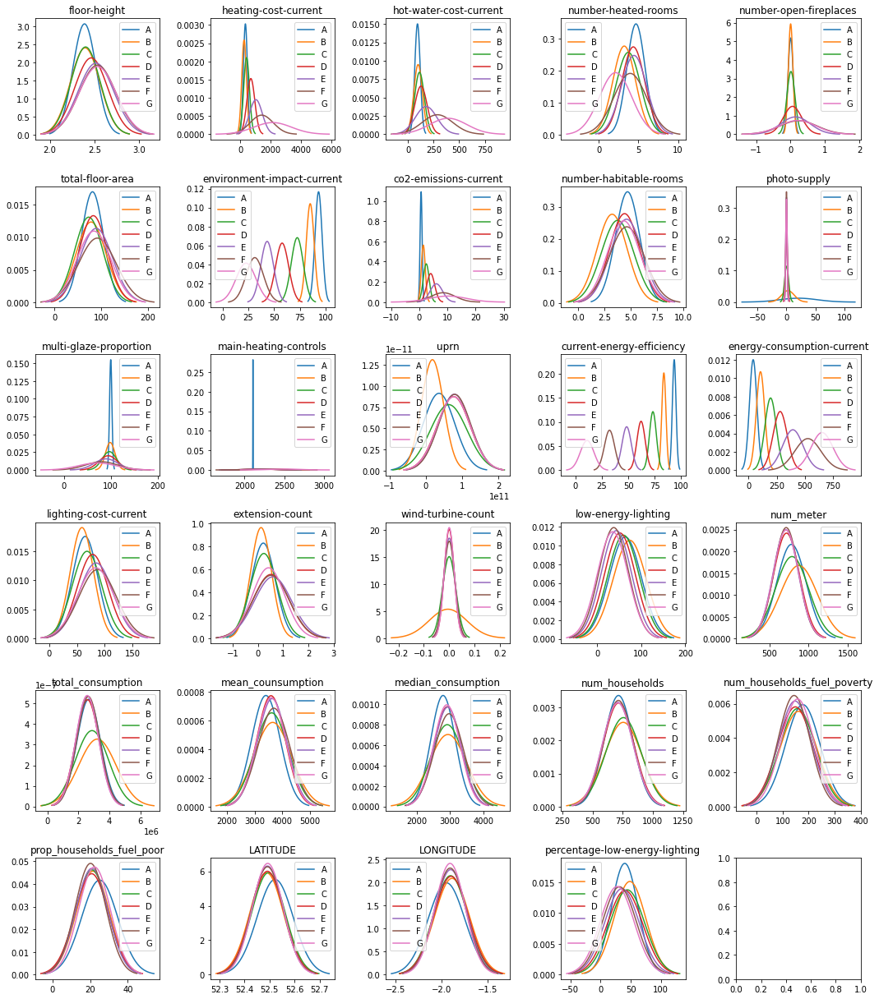

In [16]:
fig, axs= plt.subplots(6,5,figsize=(15,17))
axs_list = axs.ravel()

for i, col in enumerate(mean.columns):
    for row in mean[col].index:
        x = np.linspace(mean[col][row] - 3*std[col][row], mean[col][row] + 3*std[col][row], 100)
        axs_list[i].plot(x, stats.norm.pdf(x, mean[col][row], std[col][row]), label = row)

    axs_list[i].legend()
    axs_list[i].set_title(col)

plt.tight_layout()
plt.show()

In [17]:
cat_var = df.select_dtypes(['O']).columns.tolist()
not_these_var = ['address', 'postcode', 'lmk-key', 'lsoa_code', 'msoa_code', 
                 'constituency',  'current-energy-rating',
                 'local-authority']
cat_var = set(cat_var) ^ set(not_these_var)

lighting-description
construction-age-band
inspection-date


KeyError: ignored

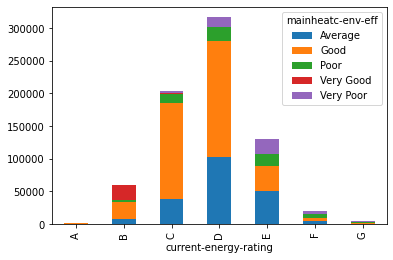

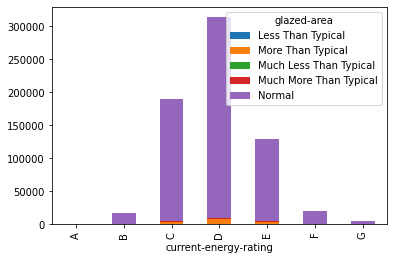

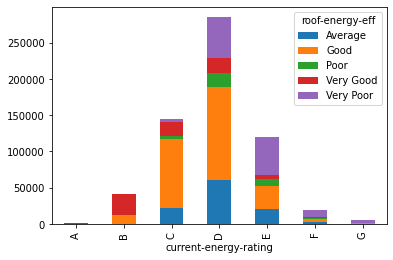

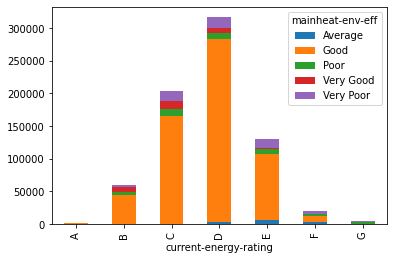

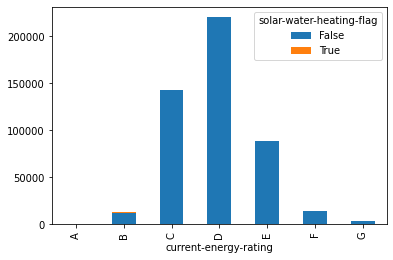

...

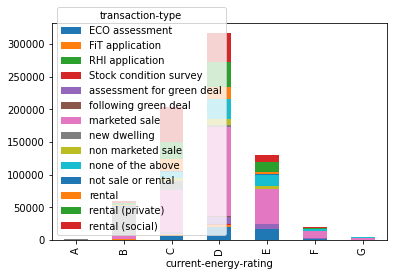

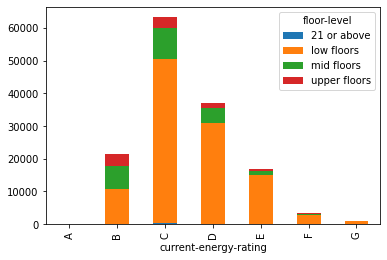

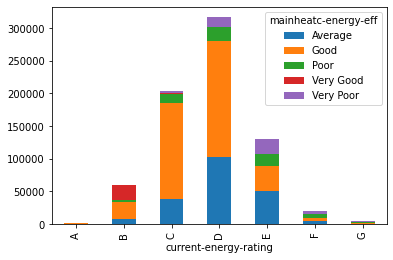

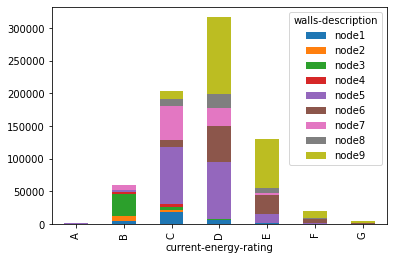

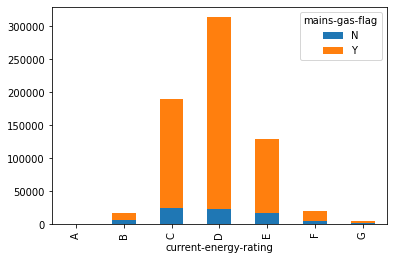

In [18]:
for i, var in enumerate(cat_var):
  agg_property = df.groupby(['current-energy-rating', var]).size()
  if len(agg_property.index)/7 < 15:
    agg_property.unstack().plot(kind='bar', stacked=True)
  else:
    print(var)

In [ ]:
import plotly.express as px
px.set_mapbox_access_token(open(".mapbox_token").read())
fig = px.scatter_mapbox(df, lat="LATITUDE", lon="LONGITUDE", color="current-energy-efficiency",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.show()

In [ ]:
fig = px.density_mapbox(df, lat='LATITUDE', lon='LONGITUDE', z='current-energy-efficiency', radius=10,
                        center=dict(lat=52.4751, lon=-1.8298), zoom=10,
                        mapbox_style="stamen-terrain")

fig.show()